In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import itertools as it

from utilities.data_visualizers import view_value_frequency, describe_col, visualize_graph, view_tensor_values, train_cross_results_v2

# the functions from the preprocess.py file which we need to use in order to get hte
# intermediate values before ratings_final.txt and kg_final.txt are outputted
from utilities.data_preprocessors import (get_length__build_value_to_index, 
normalize_ratings, 
_is_strictly_inc_by_k, 
_sample_first_n, 
has_duplicates, 
separate_pos_neg_ratings,
refactor_raw_ratings,
read_item_index_to_entity_id_file, 
convert_rating, convert_kg)

from utilities.data_loaders import load_raw_movie_1m_ratings, load_raw_movie_20k_kg, load_item_index2entity_id_file

from concurrent.futures import ThreadPoolExecutor

# pd.set_option('display.max_rows', None)
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# ratings.dat exploratory data analysis

In [80]:
data = load_raw_movie_1m_ratings('./data/ml-1m')
data

d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_loaders.py:40: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df = pd.read_csv(f'{dir_path}/ratings.dat', delimiter='::', header=None)


,user_id,item_id,rating,timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [81]:
data = normalize_ratings(data)
data

,user_id,item_id,rating,timestamp,avg_rating,normed_rating
0,1,1193,5,978300760,4.390725,0.609275
1,1,661,3,978302109,3.464762,-0.464762
2,1,914,3,978301968,4.154088,-1.154088
3,1,3408,4,978300275,3.863878,0.136122
4,1,2355,5,978824291,3.854375,1.145625
...,...,...,...,...,...,...
1000204,6040,1091,1,956716541,2.793566,-1.793566
1000205,6040,1094,5,956704887,3.731489,1.268511
1000206,6040,562,5,956704746,3.799163,1.200837
1000207,6040,1096,4,956715648,3.976744,0.023256


## userId column

In [82]:
describe_col(data, 'user_id')

count/no. of occurences of each unique user_id out of 1000209: 

total unique values: 6040


## itemId column

In [83]:
describe_col(data, 'item_id')

count/no. of occurences of each unique item_id out of 1000209: 

total unique values: 3706


## rating column

In [84]:
describe_col(data, 'rating')

count/no. of occurences of each unique rating out of 1000209: 

total unique values: 5


In [85]:
data['rating'].describe()

count    1.000209e+06
mean     3.581564e+00
std      1.117102e+00
min      1.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      4.000000e+00
max      5.000000e+00
Name: rating, dtype: float64

## normed rating column

In [86]:
describe_col(data, 'normed_rating')

count/no. of occurences of each unique normed_rating out of 1000209: 

total unique values: 12716


In [87]:
describe_col(data, 'avg_rating')

count/no. of occurences of each unique avg_rating out of 1000209: 

total unique values: 2763


In [88]:
data['normed_rating'].describe()

count    1.000209e+06
mean    -4.830681e-18
std      9.747120e-01
min     -3.560510e+00
25%     -6.310976e-01
50%      9.375000e-02
75%      7.266667e-01
max      3.533333e+00
Name: normed_rating, dtype: float64

In [89]:
user_id_counts = data['user_id'].value_counts()
item_id_counts = data['item_id'].value_counts()
print(user_id_counts)
print(item_id_counts)

4169    2314
1680    1850
4277    1743
1941    1595
1181    1521
        ... 
5725      20
3407      20
1664      20
4419      20
3021      20
Name: user_id, Length: 6040, dtype: int64
2858    3428
260     2991
1196    2990
1210    2883
480     2672
        ... 
3458       1
2226       1
1815       1
398        1
2909       1
Name: item_id, Length: 3706, dtype: int64


d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_visualizers.py:95: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data = value_counts.sort_values(ascending=True)[:limit]


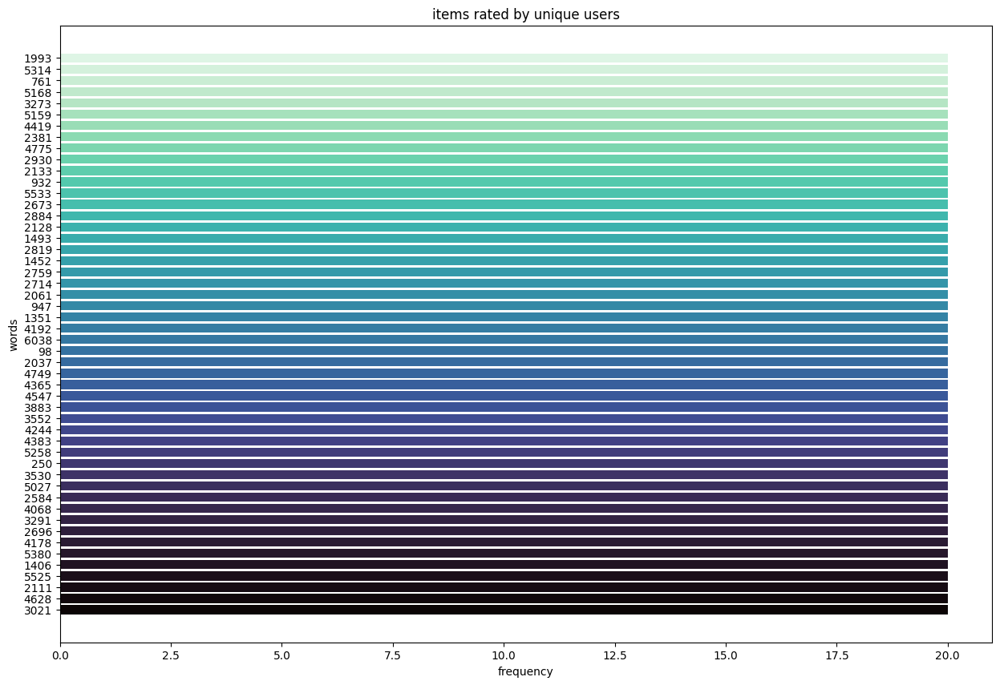

d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_visualizers.py:95: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data = value_counts.sort_values(ascending=True)[:limit]


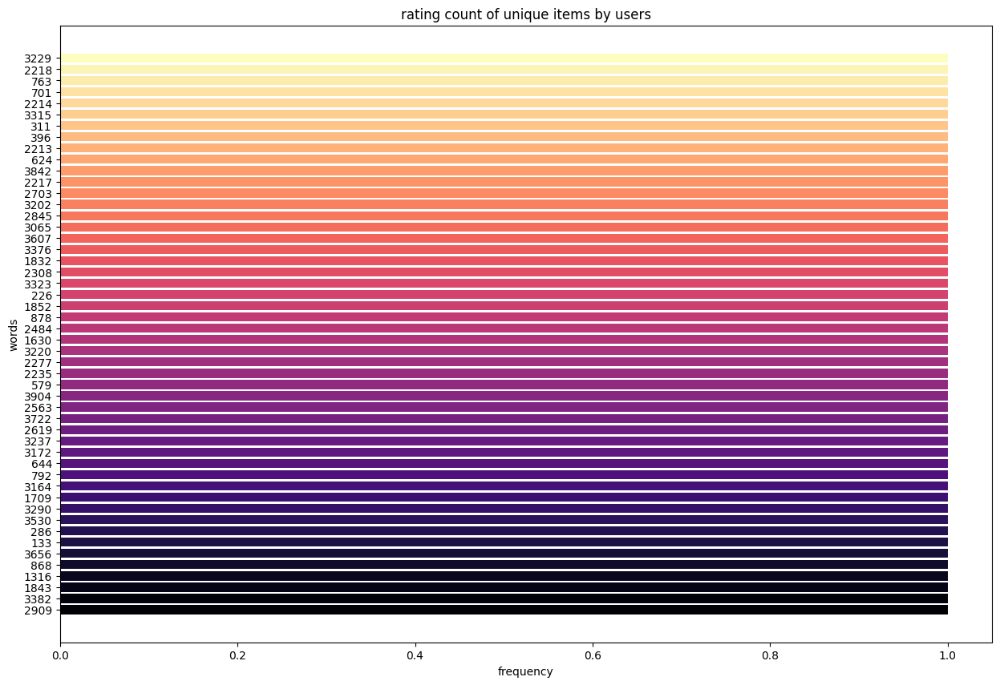

In [90]:
view_value_frequency(user_id_counts, colormap='mako', title='items rated by unique users', limit=50)
view_value_frequency(item_id_counts, colormap='magma', title='rating count of unique items by users', limit=50)

In [91]:
n_users, user_to_index = get_length__build_value_to_index(ratings=data, column='user_id')

unique user_id's: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
do unique user_id's have missing user_id's? True
number of unique user_id: 6040
sampled dictionary of all unique user_id mapped to their respective indeces from 0 to |n_u - 1| {1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11, 13: 12, 14: 13, 15: 14}


In [92]:
n_items, item_to_index = get_length__build_value_to_index(ratings=data, column='item_id')

unique item_id's: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
do unique item_id's have missing item_id's? False
number of unique item_id: 3706
sampled dictionary of all unique item_id mapped to their respective indeces from 0 to |n_i - 1| {1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11, 13: 12, 14: 13, 15: 14}


In [93]:
# modify dataframe column user_id with new indeces from 0 to n_u - 1
data['user_id'] = data['user_id'].apply(lambda user_id: user_to_index[user_id])
data['item_id'] = data['item_id'].apply(lambda item_id: item_to_index[item_id])

# mapping of indeces in the raw ratings.dat file to entity id's in the kg item_index2entity_id.txt exploratory data analysis

In [94]:
RATING_FILE_NAME = dict({'ml-1m': 'ml_1m_ratings.dat',
                         'book': 'BX-Book-Ratings.csv',
                         'music': 'user_artists.dat',
                         'news': 'ratings.txt'})
SEP = dict({'ml-1m': '::', 'book': ';', 'music': '\t', 'news': '\t'})
THRESHOLD = dict({'ml-1m': 4, 'book': 0, 'music': 0, 'news': 0})
DATASET_FOLDER = 'ml-1m'
KG_FOLDER = 'ml1m-kg20k'

entity_id2index = {}
relation_id2index = {}
item_index_old2new = {}


# for read_item_index_to_entity_id_file function
item_index2entity_id_path = f'./data/{KG_FOLDER}/item_index2entity_id.txt'
read_item_index_to_entity_id_file(item_index2entity_id_path=item_index2entity_id_path,item_index_old2new=item_index_old2new, entity_id2index=entity_id2index)

item_index_old2new_keys = item_index_old2new.keys()
item_index_old2new_values = item_index_old2new.values()
entity_id2index_keys = entity_id2index.keys()
entity_id2index_values = entity_id2index.values()

# since item_index_old2new will be modified in 
# read_item_index_to_entity_id_file test here 
# whether keys increment by 1 strictly
print(f"\nare item_index_old2new keys strictly incrementing by 1? {_is_strictly_inc_by_k(item_index_old2new_keys, 1)}\n")
print(f"\nare item_index_old2new values strictly incrementing by 1? {_is_strictly_inc_by_k(item_index_old2new_values, 1)}\n")
print(f"\ndoes item_index_old2new keys have duplicates? {has_duplicates(np.array(item_index_old2new_keys))}\n")
print(f"\ndoes item_index_old2new values have duplicates? {has_duplicates(np.array(item_index_old2new_values))}\n")

print(f"\nare entity_id2index keys incrementing by 1? {_is_strictly_inc_by_k(entity_id2index_keys, 1)}\n")
print(f"\nare entity_id2index values incrementing by 1?: {_is_strictly_inc_by_k(entity_id2index_values, 1)}\n")
print(f"\ndoes entity_id2index keys have duplicates? {has_duplicates(np.array(entity_id2index_keys))}\n")
print(f"\ndoes entity_id2index values have duplicates? {has_duplicates(np.array(entity_id2index_values))}\n")

print(f"\nsampled item_indexold2new: {_sample_first_n(item_index_old2new)}\n")
print(f"\nsampled entity_id2index: {_sample_first_n(entity_id2index)}\n")

reading item index to entity id file: ./data/ml1m-kg20k/item_index2entity_id.txt ...

are item_index_old2new keys strictly incrementing by 1? False


are item_index_old2new values strictly incrementing by 1? True


does item_index_old2new keys have duplicates? False


does item_index_old2new values have duplicates? False


are entity_id2index keys incrementing by 1? True


are entity_id2index values incrementing by 1?: True


does entity_id2index keys have duplicates? False


does entity_id2index values have duplicates? False


sampled item_indexold2new: {'1': 0, '2': 1, '3': 2, '4': 3, '5': 4, '8': 5, '10': 6, '11': 7, '12': 8, '13': 9, '14': 10, '15': 11, '17': 12, '18': 13, '19': 14}


sampled entity_id2index: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10, '11': 11, '12': 12, '13': 13, '14': 14}



# analysis of convert_rating function 

In [95]:
# for convert_rating function
input_rating_file_path = f'./data/{DATASET_FOLDER}/{RATING_FILE_NAME[DATASET_FOLDER]}'
output_rating_file_path = f'./data/{DATASET_FOLDER}/ratings_final.txt'
thresh = THRESHOLD[DATASET_FOLDER]
sep = SEP[DATASET_FOLDER]

item_set, user_pos_ratings, user_neg_ratings, rated_unrated_items = convert_rating(
    input_rating_file_path=input_rating_file_path, 
    output_rating_file_path=output_rating_file_path, 
    threshold=thresh, 
    sep=sep,
    item_index_old2new=item_index_old2new)

reading rating file ...
item_set: [0, 1, 2, 3, 4]
item_set length: 2347
converting rating file ...
number of users: 6036
number of items: 2347


In [96]:
user_pos_ratings

{1: {0,
  88,
  162,
  333,
  593,
  636,
  701,
  723,
  736,
  888,
  1028,
  1113,
  1159,
  1314,
  1349,
  1551,
  1595,
  1613,
  1617,
  1622,
  1684,
  1802,
  1808,
  1851,
  1994},
 2: {164,
  201,
  221,
  226,
  232,
  240,
  301,
  323,
  371,
  372,
  374,
  408,
  544,
  635,
  689,
  693,
  694,
  696,
  701,
  704,
  723,
  724,
  751,
  788,
  830,
  879,
  887,
  921,
  1026,
  1103,
  1108,
  1109,
  1141,
  1159,
  1261,
  1275,
  1294,
  1347,
  1381,
  1445,
  1483,
  1697,
  1753,
  1794,
  1802,
  1825,
  1891,
  1946,
  1998,
  2025,
  2034,
  2035},
 3: {63,
  162,
  301,
  372,
  412,
  607,
  623,
  658,
  694,
  695,
  696,
  704,
  750,
  759,
  795,
  808,
  1113,
  1117,
  1145,
  1214,
  1349,
  1429,
  1580,
  2001,
  2093,
  2164},
 4: {162,
  301,
  596,
  636,
  696,
  721,
  801,
  1159,
  1551,
  1700,
  1703,
  1998,
  2034,
  2189},
 5: {19,
  22,
  31,
  98,
  108,
  184,
  220,
  316,
  319,
  323,
  348,
  356,
  374,
  443,
  451,
  534,
  

# determine...
* if keys of user_pos_ratings strictly increments by 1 my strong hypothesis as to why user_pos_ratings keys seemingly increment by 1 is because the raw rating dataset has the user_id increment from 1 to the last user id which is 6040, and for each user I do believe there is bound to be one positive rating they made that is why they made it into the user_pos_ratings dictionary
* the average number of ratings made by each user in teh user_pos_ratings dictionary
* the average number of ratings made by each user in the user_neg_ratings dictionary


In [97]:
# calculates the maximum amount/number of ratings a user has made which was positive
max_num_pos_ratings = len(max(user_pos_ratings.values(), key=len))
max_num_pos_ratings

900

In [98]:
# calculates the minimum amount/number of ratings a user has made which was positive
min_num_pos_ratings = len(min(user_pos_ratings.values(), key=len))
min_num_pos_ratings

2

In [99]:
# calculates the maximum amount/number of ratings a user has made which was negative
max_num_neg_ratings = len(max(user_neg_ratings.values(), key=len))
max_num_neg_ratings

780

In [100]:
# calculates the minimum amount/number of ratings a user has made which was negative
min_num_neg_ratings = len(max(user_neg_ratings.values(), key=len))
min_num_neg_ratings

780

In [101]:
num_pos_ratings = list(map(len, user_pos_ratings.values()))
avg_num_pos_ratings = sum(num_pos_ratings) / len(num_pos_ratings)
print(f"average number of positive ratings made by users in the user_pos_ratings dictionary is {avg_num_pos_ratings}")

num_neg_ratings = list(map(len, user_neg_ratings.values()))
avg_num_neg_ratings = sum(num_neg_ratings) / len(num_neg_ratings)
print(f"average number of positive ratings made by users in the user_pos_ratings dictionary is {avg_num_neg_ratings}")

average number of positive ratings made by users in the user_pos_ratings dictionary is 62.43969516235918
average number of positive ratings made by users in the user_pos_ratings dictionary is 46.448745638810436


#### From this average number of 62  positive ratings and an average number of 46 negative ratings made by users which add up to 108 or roughly a hundred we can infer that most users interacted with about a hundred items

## Testing initial models

In [102]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import L2
from tensorflow.keras.losses import MeanSquaredError as mse_loss
from tensorflow.keras.metrics import MeanSquaredError as mse_metric
from tensorflow import GradientTape

## Define architecture of test model
* For the input, since length of user_id is only a scalar. Input would be $(none, 1)$ or $(m, 1)$
* For the user and item embedding layer, we would have embedding matrix of $(n_{users}, 32)$ and $(n_{items}, 32)$ respectively in all training examples this would have shape $(m ,1 ,32)$
* For the user and item embedding bias layer would have embedding matrix of $(n_{users}, 1)$ the same as the learned bias vector *BETA* ($\Beta$) in matrix factorization in all training examples this would have $(m, 1, 1)$
* multiply the user_embedding and item embedding tensors $[0][1][2]$; this is the axis indeces of a 3d tensor so we multiply our $(m, 1, 100)$ user embedding to a $(m, 100, 1)$ transpose of the item embedding in the $[2]$ axis index of our user tensor which is 100 we multiply transpose

In [103]:
# since length of user_id is only a scalar. Input would be None, 1 or m x 1
user_id_input = tf.keras.Input(shape=(1,), dtype=tf.int64, name='user_id')
item_id_input = tf.keras.Input(shape=(1,), dtype=tf.int64, name='item_id')

# user and item embedding layer
user_emb_layer = tf.keras.layers.Embedding(n_users, 32, embeddings_regularizer=L2(1), name='user_embedding')
item_emb_layer = tf.keras.layers.Embedding(n_items, 32, embeddings_regularizer=L2(1), name='item_embedding')

# bias vector embedding layer
user_emb_bias_layer = tf.keras.layers.Embedding(n_users, 1, embeddings_initializer='zeros', name='user_embedding_bias')
item_emb_bias_layer = tf.keras.layers.Embedding(n_items, 1, embeddings_initializer='zeros', name='item_embedding_bias')

# output layers
dot_layer = tf.keras.layers.Dot(axes=(2, 1))
add_layer = tf.keras.layers.Add()

## the ff. defines the forward pass architecture of the inputs of the matrix factorization model

In [104]:
# forward pass
user_emb = user_emb_layer(user_id_input)
item_emb = item_emb_layer(item_id_input)

user_emb_bias = user_emb_bias_layer(user_id_input)
item_emb_bias = item_emb_bias_layer(item_id_input)

# out = tf.linalg.matmul(user_emb, tf.transpose(item_emb, perm=[0, 2, 1])) + user_emb_bias + item_emb_bias
user_item_dot = dot_layer([user_emb, tf.transpose(item_emb, perm=[0, 2, 1])])
out = add_layer([user_item_dot, user_emb_bias, item_emb_bias])

model = tf.keras.Model(inputs=[user_id_input, item_id_input], outputs=out)
model.summary()

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss=mse_loss(),
    metrics=[mse_metric()]
)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 item_id (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 user_id (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 item_embedding (Embedding)     (None, 1, 32)        118592      ['item_id[0][0]']                
                                                                                                  
 user_embedding (Embedding)     (None, 1, 32)        193280      ['user_id[0][0]']                
                                                                                            

In [105]:
# view embeddings shape
print(user_emb.shape)
print(item_emb.shape)

(None, 1, 32)
(None, 1, 32)


In [106]:
print(view_tensor_values(user_emb))

KerasTensor(type_spec=TensorSpec(shape=(None, 1, 32), dtype=tf.float32, name=None), name='Placeholder:0', description="created by layer 'tf.convert_to_tensor_1'")


In [107]:
# # uses the normalizer function for the ratigns then 
# # restores it after prediction
# history = model.fit(
#     [ml_1m_ratings['user_id'], ml_1m_ratings['item_id']], ml_1m_ratings['normed_rating'],
#     batch_size=1024,
#     epochs=20,
#     validation_split=0.5
# )

In [108]:
# train_cross_results_v2(
#     build_results(history, metrics=['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error']), 
#     history.epoch, img_title='matrix factorization model results'
# )

In [109]:
# # shape of embedding matrix for items
# model.get_weights()[0].shape

In [110]:
# model.get_weights()[1].shape

In [111]:
# for layer, weights in enumerate(model.get_weights()):
#     print(f"layer {layer} shape of weights/coefficients: {weights.shape}")

## Seeing again the architecture of test models
The test models below uses both FM (Factorizatoin Machine) architecture and the DFM (Deep Factorization Machine) architecture respectively. Using self.summary() method of keras' built-in Model class

# Insights:
1. In 1m rows of ratings there are 6040 unique users
2. In 1m rows of ratings there are 3706 unique items that were rated

# Knowledge Graph/Network analysis

In [112]:
# 20782 rows
kg = load_raw_movie_20k_kg('./data/ml1m-kg20k')
kg

,head,relation,tail
0,749,film.film.writer,2347
1,1410,film.film.language,2348
2,1037,film.film.language,2348
3,1088,film.film.writer,2349
4,1391,film.film.language,2348
...,...,...,...
20777,2308,film.film.writer,4284
20778,869,film.film.language,2348
20779,1953,film.film.genre,2362
20780,2705,film.film.director,5417


#### check if there are duplicates in the knowledge graph meaning there are duplicate triples

In [113]:
kg.value_counts()

head  relation            tail
0     film.film.country   2353    1
1603  film.film.rating    2359    1
1605  film.film.director  3827    1
      film.film.country   2490    1
1604  film.film.writer    6277    1
                                 ..
802   film.film.language  2348    1
      film.film.genre     2479    1
                          2476    1
                          2362    1
5977  film.film.rating    2664    1
Length: 20782, dtype: int64

#### ...ok so there are no duplicate triples

#### check unique values of head entities

In [114]:
describe_col(kg, 'head')

count/no. of occurences of each unique head out of 20782: 

total unique values: 2445


#### check unique values of relations

count/no. of occurences of each unique relation out of 20782: 

total unique values: 7


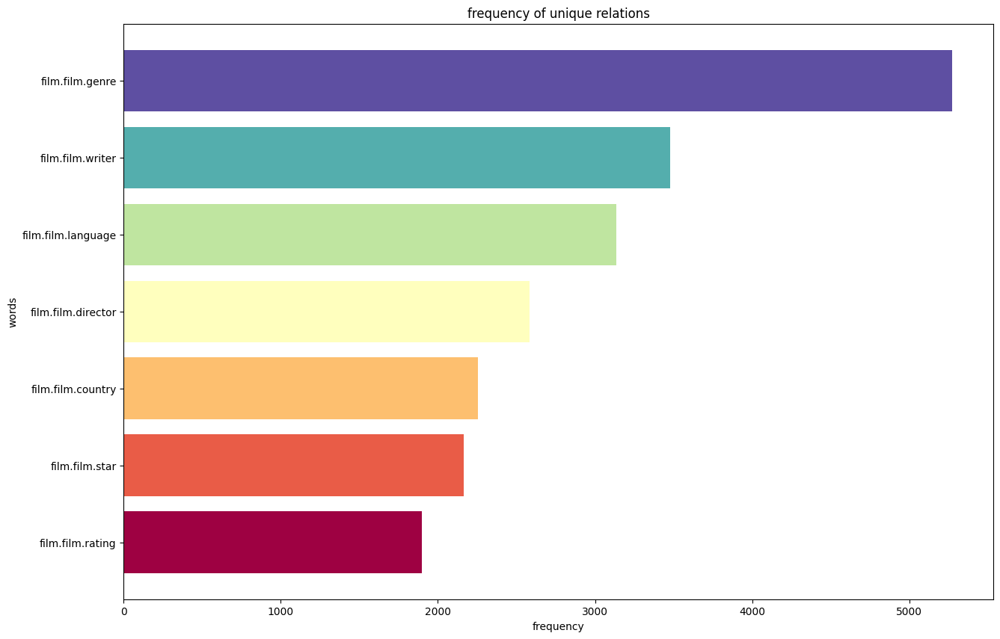

In [115]:
describe_col(kg, 'relation')

relations_count = kg['relation'].value_counts()
view_value_frequency(relations_count, colormap='Spectral', title='frequency of unique relations', limit=relations_count.shape[0])

#### Check unique values of tail entities 

In [116]:
describe_col(kg, 'tail')

count/no. of occurences of each unique tail out of 20782: 

total unique values: 4563


but we know that tail entities could be in fact also head entities so what we have to do instead is count the number of entities in the knowledge graph. If we check the item_id2entity_id.txt

which I assume would be the number of items appearing in our knowledge graph as entities

# Analyze what nodes are connected to who

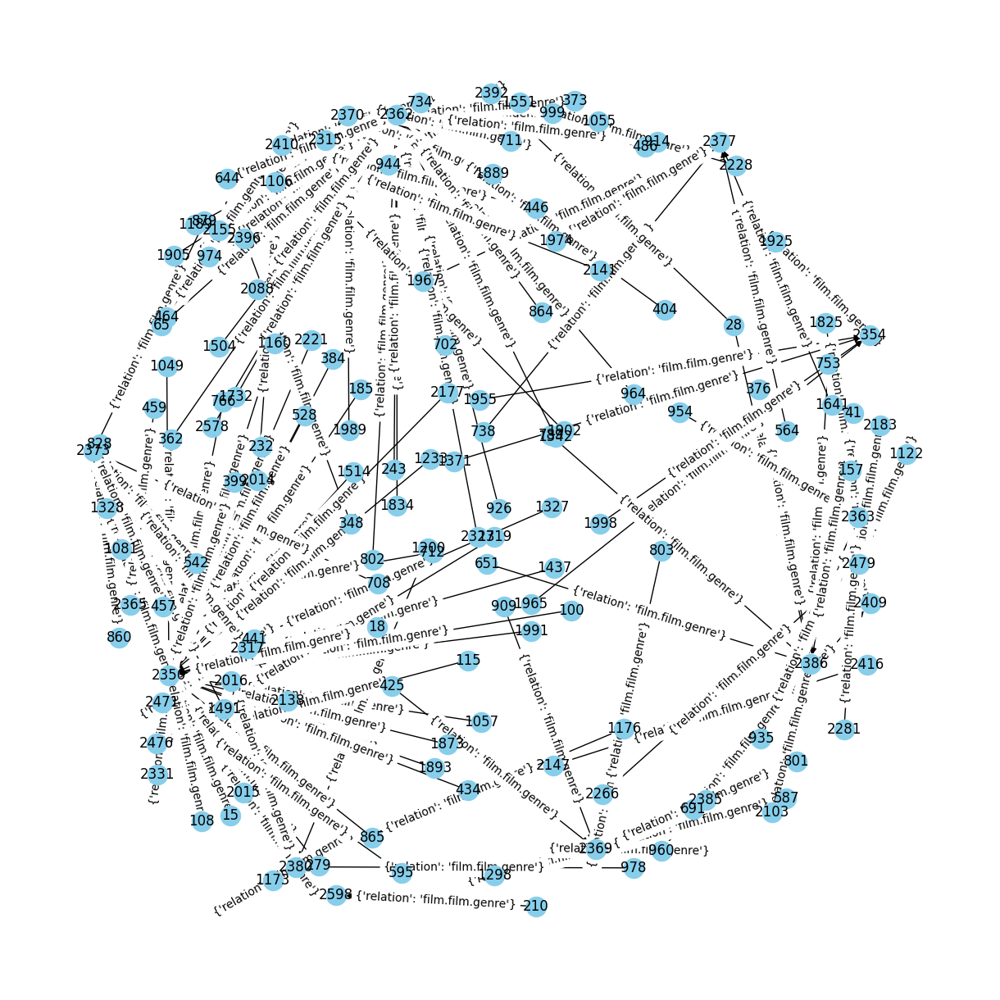

In [117]:
visualize_graph(kg)

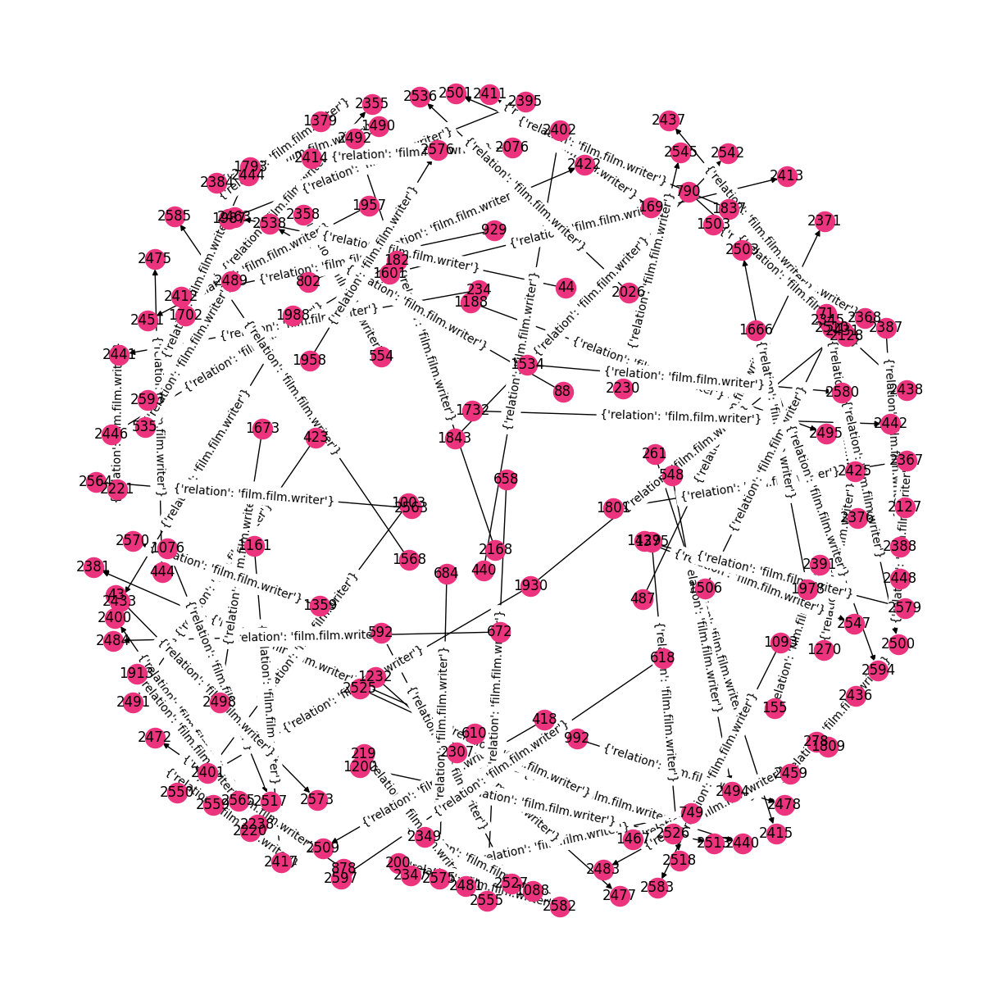

In [118]:
visualize_graph(kg, edge='film.film.writer', node_color='#eb347d')

# Does the head and tail entities appear as an item in the user item interaction data...,
or the more accurate question would be does the items in the itemID column alone only appear in either the knowledge graph specifically in the head and tail columns, and not the userID column at all?

In [119]:
users_in_head = data.loc[data['user_id'].isin(kg['head']), 'user_id']
print(users_in_head.to_string())
# or ml_1m_ratings in kg['tail']

0            0
1            0
2            0
3            0
4            0
5            0
6            0
7            0
8            0
9            0
10           0
11           0
12           0
13           0
14           0
15           0
16           0
17           0
18           0
19           0
20           0
21           0
22           0
23           0
24           0
25           0
26           0
27           0
28           0
29           0
30           0
31           0
32           0
33           0
34           0
35           0
36           0
37           0
38           0
39           0
40           0
41           0
42           0
43           0
44           0
45           0
46           0
47           0
48           0
49           0
50           0
51           0
52           0
53           1
54           1
55           1
56           1
57           1
58           1
59           1
60           1
61           1
62           1
63           1
64           1
65           1
66        

In [120]:
users_in_tail = data.loc[data['user_id'].isin(kg['tail']), 'user_id']
print(users_in_tail)

396568     2347
396569     2347
396570     2347
396571     2347
396572     2347
           ... 
1000204    6039
1000205    6039
1000206    6039
1000207    6039
1000208    6039
Name: user_id, Length: 590556, dtype: int64


In [121]:
items_in_head = data.loc[data['item_id'].isin(kg['head']), 'item_id']
print(items_in_head)

0          1104
1           639
2           853
4          2162
5          1107
           ... 
1000204    1019
1000205    1022
1000206     548
1000207    1024
1000208    1025
Name: item_id, Length: 698898, dtype: int64


In [122]:
items_in_tail = data.loc[data['item_id'].isin(kg['tail']), 'item_id']
print(items_in_tail)

3          3177
7          2599
13         2710
15         2586
16         2483
           ... 
1000179    2557
1000183    3493
1000184    2586
1000185    2589
1000191    3508
Name: item_id, Length: 301311, dtype: int64


d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_visualizers.py:95: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data = value_counts.sort_values(ascending=True)[:limit]


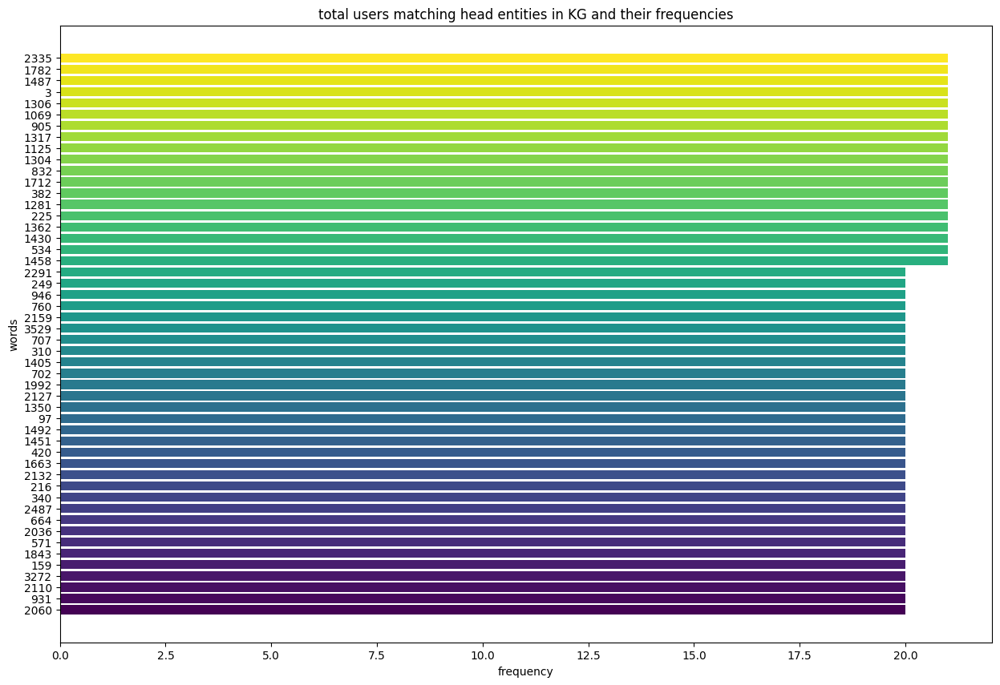

d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_visualizers.py:95: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data = value_counts.sort_values(ascending=True)[:limit]


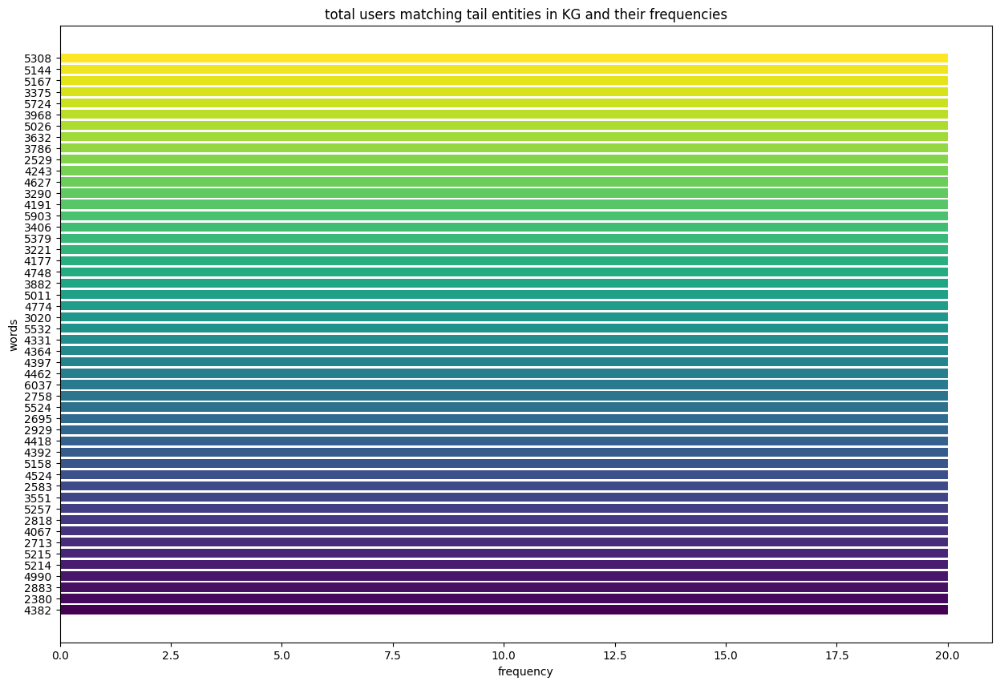

In [123]:
users_in_head_freq = users_in_head.value_counts()
users_in_tail_freq = users_in_tail.value_counts()
view_value_frequency(users_in_head_freq, colormap='viridis', title='total users matching head entities in KG and their frequencies', limit=50)
view_value_frequency(users_in_tail_freq, colormap='viridis', title='total users matching tail entities in KG and their frequencies', limit=50)

## Number of users in head and tail entities

In [124]:
users_in_head_freq

1679    1850
1940    1595
1180    1521
888     1518
2062    1323
        ... 
310       20
2127      20
1350      20
1451      20
2060      20
Name: user_id, Length: 2445, dtype: int64

In [125]:
users_in_tail_freq

4168    2314
4276    1743
3617    1344
5794    1277
4343    1271
        ... 
4177      20
4748      20
3786      20
4774      20
4382      20
Name: user_id, Length: 3595, dtype: int64

d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_visualizers.py:95: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data = value_counts.sort_values(ascending=True)[:limit]


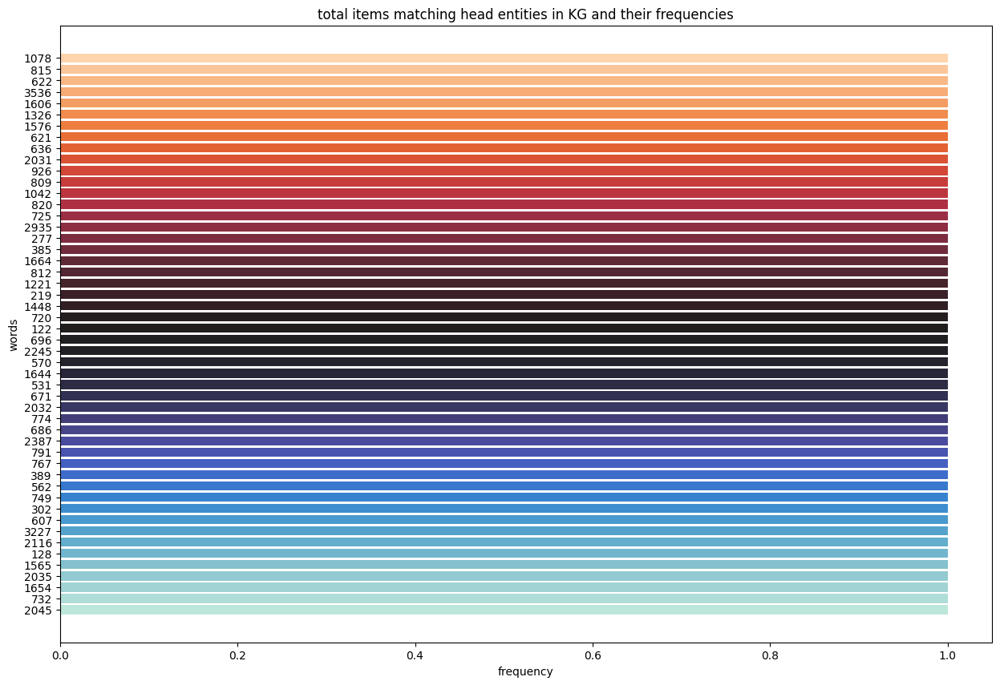

d:\Projects\To Github\phil-jurisprudence-recsys\utilities\data_visualizers.py:95: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data = value_counts.sort_values(ascending=True)[:limit]


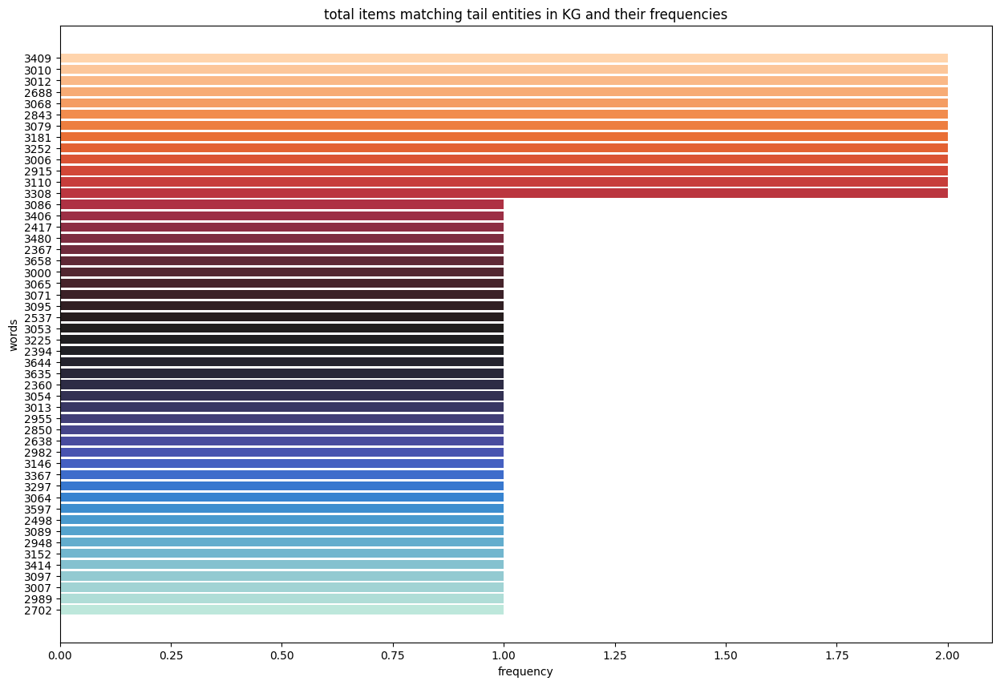

In [126]:
items_in_head_freq = items_in_head.value_counts()
items_in_tail_freq = items_in_tail.value_counts()
view_value_frequency(items_in_head_freq, colormap='icefire', title='total items matching head entities in KG and their frequencies', limit=50)
view_value_frequency(items_in_tail_freq, colormap='icefire', title='total items matching tail entities in KG and their frequencies', limit=50)

## Number of items in head and tail entities

In [127]:
items_in_head_freq

253     2991
1106    2990
1120    2883
466     2672
1848    2653
        ... 
747        1
633        1
134        1
809        1
2045       1
Name: item_id, Length: 2416, dtype: int64

In [128]:
items_in_tail_freq

2651    3428
2374    2590
2557    2459
2426    2250
2785    2241
        ... 
3644       1
3071       1
3635       1
3013       1
2702       1
Name: item_id, Length: 1290, dtype: int64

# Group frequencies

In [129]:
users_in_head_freq.rename_axis('unique_values').groupby('unique_values').head().shape

(2445,)

In [130]:
users_in_tail_freq.rename_axis('unique_values').groupby('unique_values').head().shape

(3595,)

In [131]:
items_in_head_freq.rename_axis('unique_values').groupby('unique_values').head().shape

(2416,)

In [132]:
items_in_tail_freq.rename_axis('unique_values').groupby('unique_values').head().shape

(1290,)

# Should users also have to exist in the knowledge graph...,
is the question, because my theory is that they shouldn't sicne the kg should only contain semantic information about things other than the user which will more likely than not contain information about hte items the users could potentially interact with and therefore recommend

A second theory as to why users are still appearing in this knowledge graph should we follow through on the first theory is that it hasn't been preprocessed yet like Hongwei, Wang's code in their paper does. kg.txt and 

# Theories above about users in the knowledge graph will be disregarded
the real question is for instance (2317 film.film.director 2364) is it really (movie 2317 was directed by director 2364) where the movie/item is the head entity or is (director 2364 directed movie 2317) the correct one where the movie/item is the tail entity. To prove these two competing hypotheses I will run a function where each unique item is checked if it occurs at least once as a tail in the knowledge graph and then we collect these in a list shoudl they occur, and assign them to a key where we can transform them to a pandas series

same goes with each unique item that occurs at least once as a head entity in the knowledge graph, we collect these occuring items in a list and use this list to create a pandas series

if length of either series matches the number of rows in the item_index2entity_id.txt then that will be the correct hypothesis

In [133]:
unique_item_ids = pd.DataFrame({'unique_item_id': data['item_id'].unique()})

In [134]:
unique_item_ids

,unique_item_id
0,1104
1,639
2,853
3,3177
4,2162
...,...
3701,2017
3702,2498
3703,2638
3704,3367


In [135]:
unique_item_ids.shape

(3706, 1)

#### Match all ids to the head and tail column of the kg and merge them

In [136]:
items_in_tail = kg.merge(unique_item_ids, how='inner', left_on='tail', right_on='unique_item_id').groupby(['tail', 'unique_item_id']).count().reset_index()
items_in_tail

,tail,unique_item_id,head,relation
0,2347,2347,15,15
1,2348,2348,2252,2252
2,2349,2349,1,1
3,2350,2350,970,970
4,2351,2351,1,1
...,...,...,...,...
1285,3701,3701,1,1
1286,3702,3702,3,3
1287,3703,3703,2,2
1288,3704,3704,3,3


In [137]:
items_in_head = kg.merge(unique_item_ids, how='inner', left_on='head', right_on='unique_item_id').groupby(['head', 'unique_item_id']).count().reset_index()
items_in_head

,head,unique_item_id,relation,tail
0,0,0,14,14
1,1,1,13,13
2,2,2,7,7
3,3,3,10,10
4,4,4,12,12
...,...,...,...,...
2411,3580,3580,6,6
2412,3613,3613,6,6
2413,3636,3636,9,9
2414,3642,3642,4,4


In [138]:
item_index2entity_id = load_item_index2entity_id_file('./data/ml1m-kg20k')

In [139]:
item_index2entity_id

,item_index,entity_id
0,1,0
1,2,1
2,3,2
3,4,3
4,5,4
...,...,...
2342,3944,2342
2343,3945,2343
2344,3949,2344
2345,3950,2345


#### See how many items_in_head, and how many items_in_tail match the item_index column of the item_index2entity_id 

In [140]:
matched_items_in_tail = items_in_tail.merge(item_index2entity_id, how='inner', left_on='unique_item_id', right_on='item_index')
matched_items_in_tail

,tail,unique_item_id,head,relation,item_index,entity_id
0,2347,2347,15,15,2347,1342
1,2348,2348,2252,2252,2348,1343
2,2350,2350,970,970,2350,1344
3,2351,2351,1,1,2351,1345
4,2352,2352,5,5,2352,1346
...,...,...,...,...,...,...
800,3700,3700,1,1,3700,2187
801,3701,3701,1,1,3701,2188
802,3702,3702,3,3,3702,2189
803,3703,3703,2,2,3703,2190


In [141]:
matched_items_in_head = items_in_head.merge(item_index2entity_id, how='inner', left_on='unique_item_id', right_on='item_index')
matched_items_in_head

,head,unique_item_id,relation,tail,item_index,entity_id
0,1,1,13,13,1,0
1,2,2,7,7,2,1
2,3,3,10,10,3,2
3,4,4,12,12,4,3
4,5,5,9,9,5,4
...,...,...,...,...,...,...
1382,3536,3536,8,8,3536,2082
1383,3580,3580,6,6,3580,2107
1384,3613,3613,6,6,3613,2125
1385,3636,3636,9,9,3636,2141


#### Conclusion: Maybe this is really what Wang, H. et. al. meant when they wanted to collect all the valid ID's or rather the item_id's in the raw rating file (ratings.dat) that strictly matches once in the tail of all the triples in the raw knowledge graph file (kg.txt) the head column of the kg file is what they meant as the tail entity or the item that they used to match the item id's in the raw rating file with since also in the `preprocess.py` file the head entities not in the entity_id2index which was the mapping list of unique item ids to the `entity_id` occuring in the raw rating dataset that also occured in the knowledge graph were also excluded in the final knowledge graph.

#### And items that match with no entities in the 

# Converting ratings to binary values 0 and 1 and reducing raw ratings to only positive ratings and unwatched items
* first is of course to pass ratings df & `user_id`, and ratings again & `item_id` string to `get_length__build_value_to_index`
* return values will have var names `n_items`, `old_item_idx2new_item_idx`
* for users the same thing...`n_users`, `old_user_idx2new_user_idx`
* use built lookup dictionaries to renew user id and item id columns using `.apply()` method of dataframe
* pass new dataframe to `separate_pos_neg_ratings()` func
* separate pos and neg ratings based on threshold by vectorization

In [142]:
n_users, user_to_index = get_length__build_value_to_index(data, 'user_id', show_logs=False)
n_items, item_to_index = get_length__build_value_to_index(data, 'item_id', show_logs=False)

data['user_id'] = data['user_id'].apply(lambda user_id: user_to_index[user_id])
data['item_id'] = data['item_id'].apply(lambda item_id: item_to_index[item_id])

data

,user_id,item_id,rating,timestamp,avg_rating,normed_rating
0,0,1104,5,978300760,4.390725,0.609275
1,0,639,3,978302109,3.464762,-0.464762
2,0,853,3,978301968,4.154088,-1.154088
3,0,3177,4,978300275,3.863878,0.136122
4,0,2162,5,978824291,3.854375,1.145625
...,...,...,...,...,...,...
1000204,6039,1019,1,956716541,2.793566,-1.793566
1000205,6039,1022,5,956704887,3.731489,1.268511
1000206,6039,548,5,956704746,3.799163,1.200837
1000207,6039,1024,4,956715648,3.976744,0.023256


In [143]:
data['item_id'].value_counts()

2651    3428
253     2991
1106    2990
1120    2883
466     2672
        ... 
3225       1
2039       1
1641       1
387        1
2702       1
Name: item_id, Length: 3706, dtype: int64

In [144]:
data['user_id'].value_counts()

4168    2314
1679    1850
4276    1743
1940    1595
1180    1521
        ... 
5724      20
3406      20
1663      20
4418      20
3020      20
Name: user_id, Length: 6040, dtype: int64

In [145]:
pos_user_ratings, neg_user_ratings = separate_pos_neg_ratings(data)

0           True
1          False
2          False
3           True
4           True
           ...  
1000204    False
1000205     True
1000206     True
1000207     True
1000208     True
Name: rating, Length: 1000209, dtype: bool


In [146]:
pos_user_ratings

{0: {0,
  47,
  144,
  253,
  513,
  517,
  574,
  580,
  581,
  593,
  740,
  858,
  877,
  957,
  963,
  964,
  970,
  1025,
  1104,
  1117,
  1154,
  1178,
  1195,
  1421,
  1439,
  1574,
  1658,
  1727,
  1781,
  1782,
  1838,
  1848,
  2102,
  2162,
  2205,
  2488,
  2557,
  2586,
  2592,
  2599,
  2710,
  2889,
  2898,
  2969,
  3177},
 1: {106,
  157,
  258,
  309,
  339,
  346,
  358,
  370,
  443,
  466,
  501,
  575,
  576,
  579,
  627,
  702,
  859,
  920,
  1024,
  1047,
  1099,
  1104,
  1106,
  1108,
  1117,
  1120,
  1135,
  1154,
  1155,
  1167,
  1201,
  1259,
  1271,
  1337,
  1406,
  1414,
  1420,
  1478,
  1618,
  1656,
  1693,
  1765,
  1773,
  1774,
  1775,
  1777,
  1782,
  1822,
  1848,
  1886,
  2013,
  2046,
  2078,
  2160,
  2203,
  2307,
  2374,
  2651,
  2735,
  2816,
  2821,
  2853,
  2856,
  2879,
  2889,
  2931,
  3031,
  3107,
  3186,
  3219,
  3235,
  3238,
  3341},
 2: {101,
  253,
  466,
  538,
  576,
  632,
  699,
  982,
  1007,
  1059,
  1106,
  1

In [147]:
neg_user_ratings

{0: {639, 689, 708, 853, 1107, 2128, 2147, 2483},
 1: {20,
  92,
  159,
  228,
  283,
  420,
  428,
  445,
  484,
  626,
  737,
  841,
  1012,
  1018,
  1031,
  1123,
  1127,
  1152,
  1153,
  1161,
  1173,
  1273,
  1286,
  1306,
  1428,
  1466,
  1550,
  1553,
  1623,
  1631,
  1737,
  1788,
  1826,
  1945,
  2086,
  2120,
  2128,
  2166,
  2234,
  2296,
  2426,
  2512,
  2523,
  2645,
  2674,
  2708,
  2891,
  2892,
  3032,
  3033,
  3412,
  3436,
  3457,
  3493,
  3566,
  3647},
 2: {579,
  627,
  1169,
  1173,
  1178,
  1327,
  1449,
  1504,
  2415,
  2785,
  2898,
  3301,
  3379,
  3622},
 3: {1106, 1120, 3294},
 4: {5,
  15,
  23,
  35,
  38,
  46,
  50,
  144,
  188,
  196,
  209,
  217,
  222,
  258,
  265,
  279,
  290,
  309,
  312,
  343,
  346,
  347,
  398,
  447,
  483,
  487,
  567,
  699,
  754,
  804,
  907,
  1021,
  1050,
  1102,
  1151,
  1176,
  1187,
  1325,
  1356,
  1371,
  1384,
  1391,
  1406,
  1430,
  1463,
  1485,
  1506,
  1513,
  1516,
  1546,
  1547,
  

In [148]:
type(pos_user_ratings[0])

set

# the next and final step is to concurrently create the dataset based on these positive and negative ratings

In [149]:
refactored_data = refactor_raw_ratings(pos_user_ratings, neg_user_ratings, item_to_index)

0
{0, 513, 1025, 1154, 517, 1421, 144, 2710, 2969, 1178, 2586, 2205, 1439, 2592, 1574, 2599, 1195, 1838, 47, 2102, 2488, 1848, 957, 574, 1727, 963, 580, 581, 964, 2889, 970, 1104, 593, 2898, 858, 1117, 740, 3177, 877, 2162, 1781, 1782, 253, 1658, 2557}
45 3653
1
{2816, 1024, 258, 2307, 1154, 2821, 1414, 1155, 1420, 3341, 1167, 3219, 1047, 920, 2203, 1693, 2078, 157, 1822, 1406, 3235, 3107, 2853, 3238, 2856, 2735, 1201, 309, 1848, 1337, 443, 702, 575, 576, 2879, 579, 1478, 2374, 2889, 1099, 1104, 466, 1106, 1108, 339, 1618, 3031, 346, 2651, 859, 2013, 1886, 1117, 1120, 1765, 358, 106, 1259, 1773, 1774, 1135, 2160, 1775, 1777, 627, 2931, 501, 370, 1271, 1656, 3186, 1782, 2046}
73 3577
2
{1280, 2952, 1934, 1295, 1167, 1174, 538, 1826, 1059, 1199, 699, 1212, 576, 1986, 1483, 466, 1106, 1107, 1108, 982, 2651, 1120, 2530, 101, 2277, 3429, 2664, 1900, 1007, 2162, 3189, 3318, 1781, 632, 1788, 253, 1279}
37 3655
3
{1025, 3235, 1124, 3460, 2488, 1288, 971, 1774, 466, 3186, 1108, 2173, 1111, 2743

In [150]:
refactored_data['item_id'].value_counts()

2651    2901
253     2664
1106    2547
1848    2335
1108    2330
        ... 
2989     143
1228     142
1719     141
921      139
2034     139
Name: item_id, Length: 3706, dtype: int64

In [151]:
refactored_data['user_id'].value_counts()

4276    2870
4168    2420
1679    2216
3031    1722
5830    1652
        ... 
3641      10
4294       8
4348       4
4635       4
5849       2
Name: user_id, Length: 6038, dtype: int64

In [152]:
refactored_data

,user_id,item_id,interaction
0,4130,1185,0
1,4111,2871,1
2,2564,1518,0
3,2908,2556,0
4,623,555,0
...,...,...,...
1150557,5670,1777,1
1150558,816,450,1
1150559,354,2433,0
1150560,3955,466,1


In [153]:
temp = pd.read_csv('./data/ml-1m/ratings_final.txt', sep='\t', header=None)
temp.rename(columns={0: 'user_id', 1: 'item_id', 2: 'interaction'}, inplace=True)

In [154]:
temp

,user_id,item_id,interaction
0,0,0,1
1,0,1028,1
2,0,1159,1
3,0,1802,1
4,0,1551,1
...,...,...,...
753767,6035,2129,0
753768,6035,1162,0
753769,6035,2062,0
753770,6035,1762,0


In [155]:
temp['user_id'].value_counts()

4275    1800
4167    1476
1679    1404
3538    1076
3031    1052
        ... 
3957       6
834        6
2685       4
5151       4
4347       4
Name: user_id, Length: 6036, dtype: int64

In [156]:
temp['item_id'].value_counts()

162     2663
694     2566
1159    2320
374     2310
696     2305
        ... 
1831     150
1880     148
948      147
599      146
1729     139
Name: item_id, Length: 2347, dtype: int64